# Visión por Computador - Práctica 2 - Deep Learning en Computer Vision

#### 12 puntos   |   Fecha de entrega: 15 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>MIGUEL ÁNGEL FERNÁNDEZ ALONSO</mark>

In [ ]:
# The first thing we should do is to apply hardware acceleration via GPU. So, we have to go to Editar - Configuracion del Cuaderno - Acelerador por Hardware GPU

# Now we SET UP Fastai
!pip install -Uqq fastbook
!pip install nbdev
import fastbook
fastbook.setup_book()
import fastai
import fastcore
print(f'fastcore version {fastcore.__version__} installed')
print(f'fastai version {fastai.__version__} installed')
from nbdev.showdoc import *
from fastai.vision.all import *

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━

In [ ]:
# Function to display evaluation metrics

@patch
@delegates(subplots)
def plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    names = self.metric_names[1:-1]
    n = len(names) - 1
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None: nrows = int(np.ceil(n / ncols))
    elif ncols is None: ncols = int(np.ceil(n / nrows))
    figsize = figsize or (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize, **kwargs)
    axs = [ax if i < n else ax.set_axis_off() for i, ax in enumerate(axs.flatten())][:n]
    for i, (name, ax) in enumerate(zip(names, [axs[0]] + axs)):
        ax.plot(metrics[:, i], color='#1f77b4' if i == 0 else '#ff7f0e', label='valid' if i > 0 else 'train')
        ax.set_title(name if i > 1 else 'losses')
        ax.legend(loc='best')
    plt.show()



---



---



---



# <font color='blue'>**Ejercicio 4: Primeros pasos de IA explicable aplicada a redes neuronales convolucionales (1,5 puntos)**
<font color='blue'>En este ejercicio trabajaremos con el conjunto de datos Caltech-UCSD Birds-200-2011 (https://www.vision.caltech.edu/datasets/cub_200_2011/). Este conjunto de datos consta de $11788$ imágenes de $200$ especies de aves diferentes. Tiene $200$ clases, con $5994$ para entrenamiento y $5794$ para pruebas. El $10\%$ del conjunto de entrenamiento se dejará para validación.

<font color='blue'>Usaremos el modelo de red ResNet18 ya preentrenado con ImageNet, que se puede descargar desde el repositorio de modelos de fastai. Se realizará un fine-tuning de toda la red (por $10$ épocas) tras haber incorporado una cabecera adecuada para este problema (con una única fully-connected layer). Es decir, se debe hacer algo similar a lo realizado en el apartado cuarto del ejercicio 3.





---



---



---

First, we need to read the data from the URL

In [ ]:
# https://docs.fast.ai/data.external.html
path = untar_data(URLs.CUB_200_2011)

In [ ]:
print(path)
print(path.ls())
print((path/'CUB_200_2011/').ls())
train_test_split = np.loadtxt('/root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt',dtype=int)
# !cat /root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt

print('Number of testing examples: ', (train_test_split[:,1]== 0).sum())
print('Number of training examples: ', (train_test_split[:,1]== 1).sum())
print(train_test_split)


/root/.fastai/data/CUB_200_2011
[Path('/root/.fastai/data/CUB_200_2011/attributes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011')]
[Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/classes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/bounding_boxes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/README'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/parts'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/image_class_labels.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/attributes')]
Number of testing examples:  5794
Number of training examples:  5994
[[    1     0]
 [    2     1]
 [    3     0]
 ...
 [11786     0]
 [11787     1]
 [11788     0]]


In [ ]:
with open('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images.txt') as file:
    images_list = file.readlines()
    images_list = [line.rstrip() for line in images_list]
print(images_list)

['1 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg', '2 001.Black_footed_Albatross/Black_Footed_Albatross_0009_34.jpg', '3 001.Black_footed_Albatross/Black_Footed_Albatross_0002_55.jpg', '4 001.Black_footed_Albatross/Black_Footed_Albatross_0074_59.jpg', '5 001.Black_footed_Albatross/Black_Footed_Albatross_0014_89.jpg', '6 001.Black_footed_Albatross/Black_Footed_Albatross_0085_92.jpg', '7 001.Black_footed_Albatross/Black_Footed_Albatross_0031_100.jpg', '8 001.Black_footed_Albatross/Black_Footed_Albatross_0051_796103.jpg', '9 001.Black_footed_Albatross/Black_Footed_Albatross_0010_796097.jpg', '10 001.Black_footed_Albatross/Black_Footed_Albatross_0025_796057.jpg', '11 001.Black_footed_Albatross/Black_Footed_Albatross_0023_796059.jpg', '12 001.Black_footed_Albatross/Black_Footed_Albatross_0086_796062.jpg', '13 001.Black_footed_Albatross/Black_Footed_Albatross_0049_796063.jpg', '14 001.Black_footed_Albatross/Black_Footed_Albatross_0006_796065.jpg', '15 001.Black_footed_Albatr

In [ ]:
classes = (path/'CUB_200_2011/images/').ls()
print('Number of examples per class')
for i in range(len(classes)):
  print(len(classes[i].ls()), end=" ")


Number of examples per class
60 60 58 59 60 60 60 60 60 60 60 60 60 60 60 60 60 59 48 60 52 60 60 60 58 44 60 60 60 59 60 45 60 60 60 60 60 60 60 59 60 59 59 60 60 60 60 60 60 59 53 50 59 60 60 60 60 60 60 59 60 60 60 60 60 60 60 59 58 59 60 60 60 60 60 59 60 60 60 58 56 60 60 51 56 60 60 58 60 60 60 60 59 59 60 60 60 60 59 60 59 60 57 60 60 58 60 59 59 60 60 60 50 60 60 60 60 60 60 60 60 60 60 60 56 60 60 60 60 60 60 60 60 60 59 53 60 59 60 60 60 60 59 59 60 60 60 50 60 60 60 60 60 60 60 60 60 50 60 49 60 60 60 59 53 59 60 60 59 60 60 60 60 59 60 59 41 60 60 59 60 60 60 60 60 60 60 60 59 60 57 59 60 59 60 60 60 60 60 60 

In [ ]:
#Ahora tenemos en images_list la lista con todas las imágenes, y en train_test_split cuáles pertenecen a training (1) o a test (0)
# Vamos a crear dos carpetas: una train y otra test, y vamos a meter dentro las imágenes correspondientes
print(path)
import shutil, os
if os.path.isdir('/root/.fastai/data/CUB_200_2011/train'):
  shutil.rmtree('/root/.fastai/data/CUB_200_2011/train')
if os.path.isdir('/root/.fastai/data/CUB_200_2011/test'):
  shutil.rmtree('/root/.fastai/data/CUB_200_2011/test')

shutil.copytree('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images','/root/.fastai/data/CUB_200_2011/train')
shutil.copytree('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images','/root/.fastai/data/CUB_200_2011/test')


/root/.fastai/data/CUB_200_2011


'/root/.fastai/data/CUB_200_2011/test'

In [ ]:
print((path/'train').ls())
print(len((path/'train').ls()))

[Path('/root/.fastai/data/CUB_200_2011/train/183.Northern_Waterthrush'), Path('/root/.fastai/data/CUB_200_2011/train/093.Clark_Nutcracker'), Path('/root/.fastai/data/CUB_200_2011/train/003.Sooty_Albatross'), Path('/root/.fastai/data/CUB_200_2011/train/179.Tennessee_Warbler'), Path('/root/.fastai/data/CUB_200_2011/train/130.Tree_Sparrow'), Path('/root/.fastai/data/CUB_200_2011/train/184.Louisiana_Waterthrush'), Path('/root/.fastai/data/CUB_200_2011/train/102.Western_Wood_Pewee'), Path('/root/.fastai/data/CUB_200_2011/train/103.Sayornis'), Path('/root/.fastai/data/CUB_200_2011/train/030.Fish_Crow'), Path('/root/.fastai/data/CUB_200_2011/train/011.Rusty_Blackbird'), Path('/root/.fastai/data/CUB_200_2011/train/047.American_Goldfinch'), Path('/root/.fastai/data/CUB_200_2011/train/197.Marsh_Wren'), Path('/root/.fastai/data/CUB_200_2011/train/170.Mourning_Warbler'), Path('/root/.fastai/data/CUB_200_2011/train/123.Henslow_Sparrow'), Path('/root/.fastai/data/CUB_200_2011/train/041.Scissor_taile

In [ ]:
import os
for i in range(len(train_test_split)):
    if train_test_split[i,1]==0: #test image
       os.remove(path/'train'/images_list[i].rsplit(' ')[1]) #we remove it from train
    if train_test_split[i,1]==1: #train image
      os.remove(path/'test'/images_list[i].rsplit(' ')[1]) #we remove it from test

In [ ]:
files_train = get_image_files(path/'train')
files_test = get_image_files(path/'test')
print('Total training images: ', len(files_train))
print('Total test images: ', len(files_test))


Total training images:  5994
Total test images:  5794


El conjunto de datos Caltech-UCSD Birds-200-2011 es una colección de imágenes de aves utilizado comúnmente en el campo de visión por computador para tareas de clasificación de imágenes. Algunos detalles clave sobre este dataset son los siguientes:

- Número de clases: Contiene un total de 200 clases diferentes. Cada clase representa una especie de ave única, y las imágenes están etiquetadas en consecuencia. Esto hace que el conjunto de datos sea adecuado para tareas de clasificación de imágenes en las que el objetivo es predecir la especie de ave presente en una imagen dada.

- Número total de imágenes: El conjunto de datos incluye 11,788 imágenes en total.

- División de conjuntos: Las imágenes están divididas en conjuntos de entrenamiento y prueba. En particular, hay 5,994 imágenes destinadas al conjunto de entrenamiento y 5,794 imágenes al conjunto de prueba.

[1] https://www.vision.caltech.edu/datasets/cub_200_2011/

Numero de ejemplos de entrenamiento (una vez descartados los de validacion): 21219
Numero de ejemplos de validacion: 2357


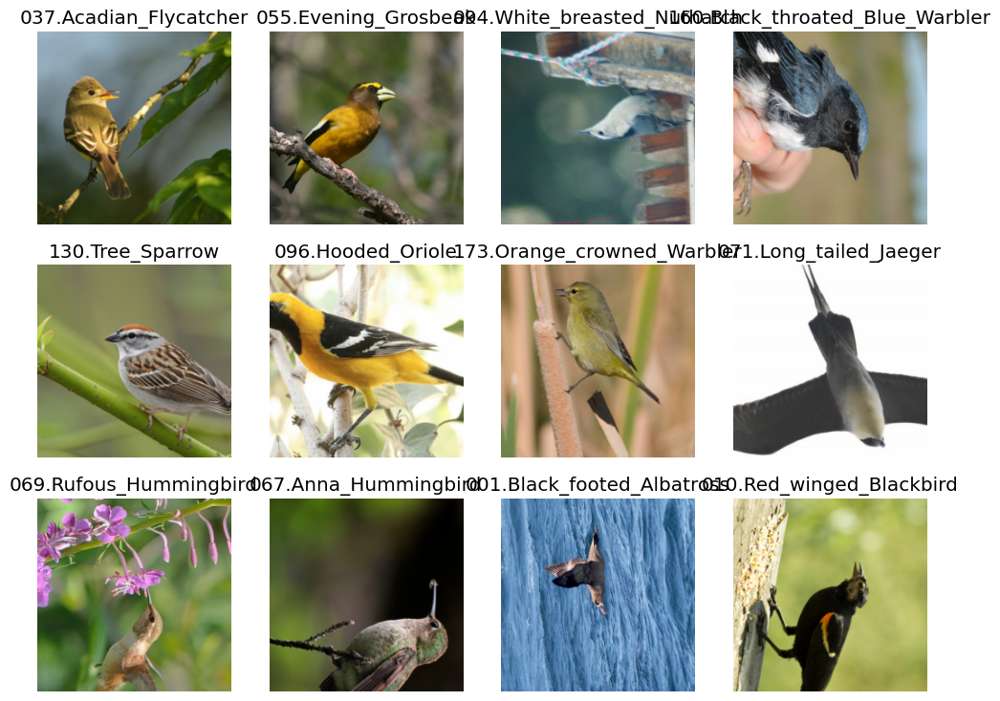

In [ ]:
CUB_200_2011 = DataBlock(
    blocks=(ImageBlock, CategoryBlock),                                         # Datos de entrada (imágenes) y etiquetas (categorías)
    get_items=get_image_files,                                                  # Función para obtener los archivos
    splitter=RandomSplitter(valid_pct=0.1, seed=42),                            # Dividimos en entrenamiento (90%) y validación (10%)
    get_y=parent_label,                                                         # Las etiquetas se obtienen del nombre de la carpeta
    item_tfms=Resize(460),                                                      # Redimensionamos las imágenes de entrada
    batch_tfms=aug_transforms(size=224,                                         # Aumentamos los datos y ajustamos al tamaño requerido por ResNet
                              max_warp=0.1,
                              max_rotate=10,
                              flip_vert=True)
)

dls = CUB_200_2011.dataloaders(path, bs=64)

dls.show_batch(max_n=12)

print('Numero de ejemplos de entrenamiento (una vez descartados los de validacion):', len(dls.train_ds))
print('Numero de ejemplos de validacion:', len(dls.valid_ds))

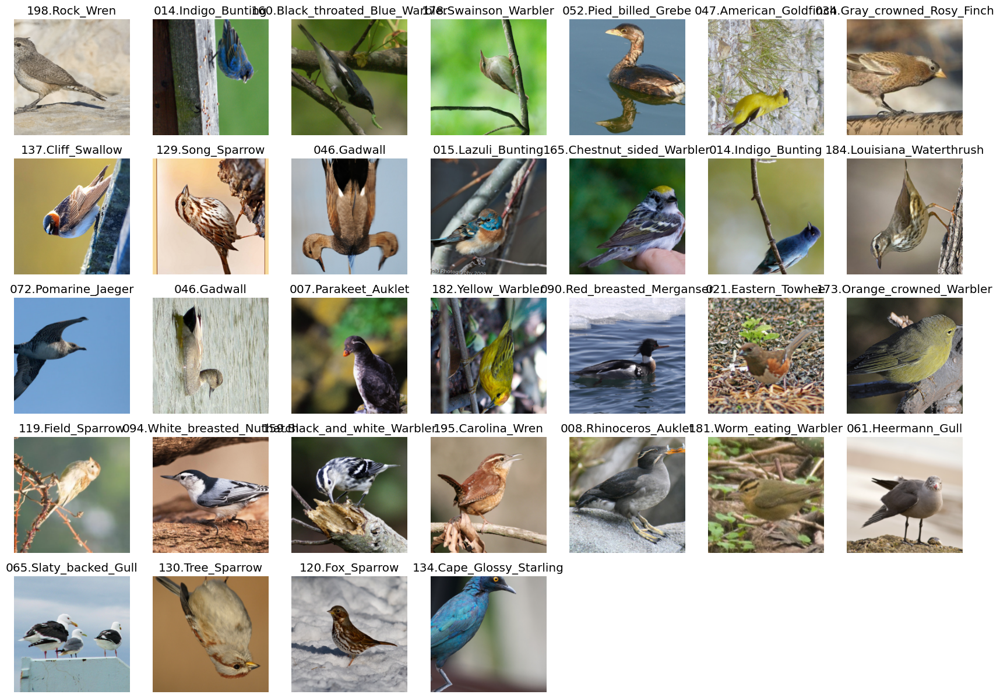

In [ ]:
# Muestra un batch de imágenes del conjunto de entrenamiento
dls.train.show_batch(max_n = 32)

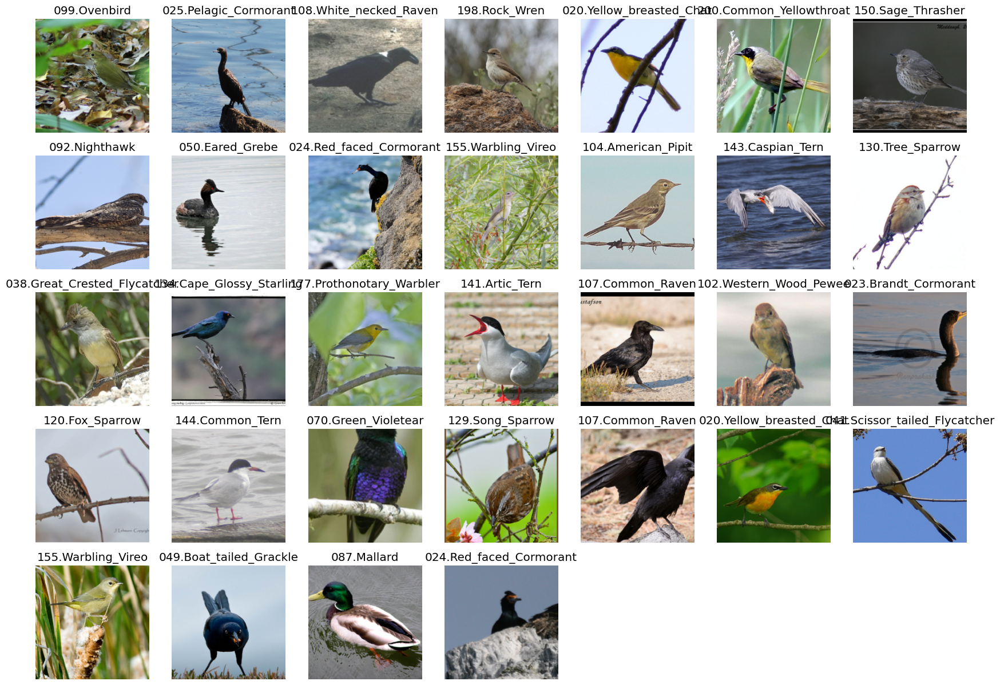

In [ ]:
# Muestra un batch de imágenes del conjunto de validación
dls.valid.show_batch(max_n = 32)

In [ ]:
# Número de clases del dataset Caltech-UCSD Birds-200-2011
num_classes = 200

**ResNet18** es una arquitectura de red neuronal profunda que forma parte de la familia **ResNet (Residual Networks)**, desarrollada por **Microsoft Research** para resolver los desafíos asociados con el entrenamiento de redes profundas. Fue presentada en el artículo *"Deep Residual Learning for Image Recognition"* por **Kaiming He, Xiangyu Zhang, Shaoqing Ren y Jian Sun** en 2016:

[Referencia](https://ieeexplore.ieee.org/document/7780459)

### Características principales de ResNet18:

1. **Bloques residuales**:  
   El elemento clave de ResNet son los bloques residuales, que utilizan conexiones de "salto" o residuales para facilitar el flujo de información a través de la red. En lugar de aprender una transformación completa, los bloques residuales aprenden la diferencia (o residuo) entre la entrada y la salida, la cual se suma a la entrada original para obtener el resultado final.

2. **Estructura básica**:  
   ResNet18 consta de **18 capas** en total, distribuidas entre convoluciones, normalización, activaciones (*ReLU*), bloques residuales y capas totalmente conectadas al final.

3. **Capas iniciales**:  
   Incluye una convolución inicial, seguida de normalización (*batch normalization*), una activación *ReLU* y una capa de *pooling* máximo para reducir las dimensiones espaciales de las características.

4. **Bloques residuales básicos**:  
   Cada bloque contiene dos capas convolucionales. La primera incluye convolución, normalización y *ReLU*, mientras que la segunda consiste en una convolución cuya salida se suma a la entrada del bloque mediante una conexión residual.

5. **Capas finales**:  
   Después de los bloques residuales, la arquitectura incluye más capas convolucionales y una capa totalmente conectada. La capa de salida tiene un número de neuronas igual al número de clases del problema de clasificación (en este caso, **200 neuronas**).

6. **Filtros y reducción dimensional**:  
   - Utiliza principalmente filtros de tamaño **3 x 3** en las capas convolucionales.  
   - Emplea capas de *pooling* máximo en ciertas etapas para reducir las dimensiones espaciales, mejorando la eficiencia computacional e introduciendo invariancia parcial a traslaciones.

---

### Ventajas y contribuciones destacadas de ResNet18:

1. **Mitigación del desvanecimiento del gradiente**:  
   Las conexiones residuales permiten que la información y los gradientes fluyan de manera más eficiente, reduciendo el impacto del problema de desvanecimiento del gradiente en redes profundas.

2. **Mayor profundidad de entrenamiento**:  
   ResNet hizo posible entrenar redes mucho más profundas que las arquitecturas anteriores, logrando mejoras notables en tareas como la clasificación de imágenes.

3. **Transferencia de aprendizaje (Transfer Learning)**:  
   Gracias a su capacidad para extraer características útiles, ResNet18 y otras variantes de ResNet son frecuentemente utilizadas como modelos preentrenados en diversas aplicaciones de visión por computador. En este ejercicio, también aprovecharemos esta característica.

ResNet18 combina eficiencia y eficacia, siendo una de las arquitecturas más utilizadas para tareas de clasificación de imágenes y transferencia de aprendizaje.

In [ ]:
# Mostrar la arquitectura de ResNet18 (FastAI ya proporciona un modelo preentrenado en ImageNet con ResNet18)
models.resnet18()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

En la arquitectura **ResNet18**, el *head* está compuesto por una capa completamente conectada cuya configuración es la siguiente:

`(fc): Linear(in_features=512, out_features=1000, bias=True)`

### Detalles de la configuración:

1. **`in_features=512`**:  
   Representa la dimensionalidad de las características de entrada a esta capa completamente conectada. Este valor es **512** porque la capa anterior es una capa de *pooling* adaptativo:  
   `AdaptiveAvgPool2d(output_size=(1, 1))`.  
   Esta capa reduce las dimensiones espaciales de las características (alto y ancho) a **1x1**, pero conserva los **512 canales** generados por las últimas capas convolucionales.

2. **`out_features=1000`**:  
   Indica la dimensionalidad de la salida de la capa completamente conectada, que en este caso es **1000**. Este valor está relacionado con el número de clases del conjunto de datos en el que fue preentrenada la arquitectura, **ImageNet**, que contiene **1000 clases**.

3. **`bias=True`**:  
   Este parámetro señala que la capa incluye un sesgo (*bias term*) en su cálculo, lo cual es común en capas lineales para mejorar la capacidad de ajuste del modelo.

En resumen, el *head* original de ResNet18 está diseñado para tareas de clasificación en el conjunto de datos **ImageNet**, pero en aplicaciones específicas, como en este caso, es habitual reemplazar esta capa final para que se ajuste al número de clases del problema objetivo (por ejemplo, **200 clases**).

La función principal de **FastAI** utilizada en este ejercicio 3 es **`vision_learner(dls, arch)`**, la cual proporciona todas las herramientas necesarias para construir un *Learner* adecuado para realizar *transfer learning* en tareas de visión por computadora. A continuación, se describen los parámetros más relevantes de esta función:

- **`dls`**: Representa el conjunto de datos encapsulado en un `DataLoader`, que incluye datos para entrenamiento, validación y, opcionalmente, pruebas.

- **`arch`**: Especifica la arquitectura del modelo a utilizar. Puede ser una predefinida (por ejemplo, **ResNet18**, como en este caso) o una personalizada.

- **`n_out`**: Define el número de salidas del modelo, es decir, la dimensionalidad de la capa de salida.

- **`pretrained`**: Indica si el modelo debe cargar pesos preentrenados. Por defecto, esta opción está activada (`pretrained=True`).

- **`loss_func`**: Define la función de pérdida que se usará durante el entrenamiento.

- **`opt_func`**: Especifica la función de optimización que se encargará de ajustar los pesos del modelo.

- **`lr`**: Indica la tasa de aprendizaje inicial para el proceso de entrenamiento.

- **`splitter`**: Una función opcional que divide los parámetros del modelo en diferentes grupos, útil para técnicas de ajuste diferenciado de tasas de aprendizaje.

- **`cbs`**: Lista de *callbacks* que pueden personalizar y monitorizar el entrenamiento.

- **`metrics`**: Conjunto de métricas utilizadas para evaluar el rendimiento del modelo.

- **`train_bn`**: Controla si se entrenarán los parámetros de normalización por lotes (*batch normalization*). Por defecto, están activados.

- **`cut`**: Índice opcional que permite cortar la arquitectura, especialmente útil cuando el modelo se compone de múltiples partes, como un extractor de características y un clasificador.

- **`custom_head`**: Permite sustituir el *head* original del modelo con una capa personalizada.

## Más información:
Puedes consultar la documentación oficial de FastAI para detalles adicionales y ejemplos prácticos:  
[FastAI Vision Learner](https://docs.fast.ai/vision.learner.html#vision_learner).

Para añadir un nuevo *head* a la arquitectura **ResNet18**, basta con definir dicho *head* y pasarlo como argumento al parámetro `custom_head` en la función **`vision_learner()`**.

Se solicita reemplazar la capa completamente conectada (*Fully Connected*, FC) original de **ResNet18** con una nueva capa FC que tenga una salida de 200 neuronas, correspondiente al número de clases de nuestro problema. Adicionalmente, se requiere entrenar únicamente los pesos de esta nueva capa, mientras se mantienen congelados los pesos del resto de la red.

### Congelación de pesos con FastAI
FastAI facilita la congelación de pesos mediante las funciones **`Learner.freeze()`** y **`Learner.freeze_to(n)`**, herramientas clave para realizar *transfer learning*:

- **`Learner.freeze()`**: Congela todas las capas del modelo, excepto las capas finales, que suelen incluir cualquier clasificador adicional que se haya añadido al modelo.

- **`Learner.freeze_to(n)`**: Congela las capas del modelo hasta la capa especificada en el índice `n`, dejando descongeladas las capas posteriores.

En este caso, **`vision_learner()`** maneja esta funcionalidad automáticamente, ya que congela los pesos de toda la red excepto los del *head*. Por lo tanto, no es necesario llamar explícitamente a estas funciones para cumplir con este requerimiento.

### Consideración sobre Batch Normalization
Por defecto, los parámetros de las capas de *Batch Normalization* (como estadísticas internas) se actualizan durante el entrenamiento. Sin embargo, si no deseamos que estas capas se adapten al nuevo conjunto de datos (como en este caso), es necesario incluir el parámetro **`train_bn=False`** al usar **`vision_learner()`**. Esto asegura que las capas de *Batch Normalization* también permanezcan congeladas.

Para más información sobre este tema, se puede consultar la siguiente referencia:  
[Por qué congelar Batch Normalization](https://stackoverflow.com/questions/63016740/why-its-necessary-to-frozen-all-inner-state-of-a-batch-normalization-layer-when).

El *Fine-Tuning*, o ajuste fino, es una estrategia común en el aprendizaje profundo (*deep learning*) y el *transfer learning*. Consiste en tomar un modelo previamente entrenado en un gran conjunto de datos y ajustar sus pesos para adaptarlo a un conjunto de datos más específico, relacionado con la tarea en cuestión.

### Pasos del proceso de Fine-Tuning

1. **Preentrenamiento:**  
   Se entrena un modelo utilizando un conjunto de datos extenso y variado, como ImageNet, para realizar una tarea general (e.g., clasificación). Este modelo aprende a extraer características y representaciones de alto nivel útiles para múltiples tareas.

2. **Transfer Learning:**  
   El modelo preentrenado se adopta como base para una nueva tarea relacionada. En lugar de iniciar con pesos aleatorios, se reutilizan los pesos previamente aprendidos, lo que acelera el aprendizaje y mejora la eficiencia.

3. **Ajuste fino (Fine-Tuning):**  
   Los pesos del modelo se ajustan utilizando un nuevo conjunto de datos objetivo. Este ajuste se realiza entrenando el modelo durante unas pocas épocas para adaptarlo a las características específicas de la nueva tarea. Dependiendo de los datos disponibles y la similitud entre las tareas, se pueden ajustar todas las capas del modelo o solo algunas finales, mientras que las restantes se mantienen congeladas.

### Fine-Tuning en FastAI

FastAI proporciona la función **`learn.fine_tune(epochs, freeze_epochs)`** para realizar el ajuste fino de manera sencilla. Esta función opera de la siguiente forma:

1. Entrena únicamente las capas añadidas al modelo (*head*) durante una época (o el número indicado en `freeze_epochs`), manteniendo congeladas las demás capas.
2. Descongela todas las capas del modelo y las entrena durante el número de épocas indicado en `epochs`.

Más detalles sobre esta función están disponibles en la [documentación oficial](https://docs.fast.ai/callback.schedule.html#learner.fine_tune).

### Uso de `Learner` en lugar de `vision_learner`

Aunque la función **`vision_learner()`** congela automáticamente los pesos excepto los del *head*, para este ejercicio usaremos **`Learner()`** en su lugar. Esto permite comenzar con todos los pesos descongelados y gestionar el ajuste fino a través de **`learn.fine_tune()`**. Para ello, es necesario crear manualmente el modelo utilizando la función **`create_vision_model()`**, que será el parámetro del `Learner`.

### Inicialización con pesos preentrenados

En **`create_vision_model()`**, el parámetro `pretrained` indica si el modelo debe utilizar pesos preentrenados o inicializarse desde cero:

- **`pretrained = True`** (valor por defecto): El modelo se inicializa con pesos preentrenados en un conjunto de datos extenso, como ImageNet, que contiene millones de imágenes y miles de clases.
- **`pretrained = False`**: Los pesos del modelo se inicializan aleatoriamente y el entrenamiento comienza desde cero en el conjunto de datos específico.

Más detalles sobre esta función están disponibles en la [documentación oficial](https://docs.fast.ai/vision.learner.html#create_vision_model).

In [ ]:
#Nuevo head (capa fully-connected con dimensionalidad adaptada a nuestro problema)
custom_head = sequential(
    nn.AdaptiveAvgPool2d(output_size = (1, 1)),                                 # Esta capa de la arquitectura original de ResNet18 también la elimina la función vision_learner(), por lo que la mantenemos en el nuevo head
    nn.Flatten(),                                                               # Capa para pasar de tensor tridimensional a tensor unidimensional (vector 1D)
    nn.Linear(in_features = 512, out_features = num_classes)                    # Capa fully-connected con dimensionalidad de salida adaptada a nuestro problema (200 clases)
)

# Modelo ResNet18 preentrenado en ImageNet con dimensionalidad adaptada a nuestro problema
pretrained_modelResNet18 = create_vision_model(models.resnet18, num_classes, custom_head = custom_head) #  pretrained = True por defecto

# Mostramos la arquitectura del modelo
pretrained_modelResNet18


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 127MB/s]


Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

epoch,train_loss,valid_loss,accuracy,time
0,2.869220,3.493849,0.210013,04:08


epoch,train_loss,valid_loss,accuracy,time
0,1.205476,0.992030,0.714468,03:58
1,1.272237,1.406172,0.615613,03:57
2,1.277282,1.313004,0.629190,03:56
3,1.023845,1.040604,0.697921,03:50
4,0.769967,0.666027,0.802715,03:57
5,0.582382,0.513206,0.853628,04:10
6,0.376333,0.308103,0.910904,04:03
7,0.236247,0.194942,0.952482,03:57
8,0.170388,0.151350,0.966907,03:51
9,0.135877,0.143032,0.966907,03:53


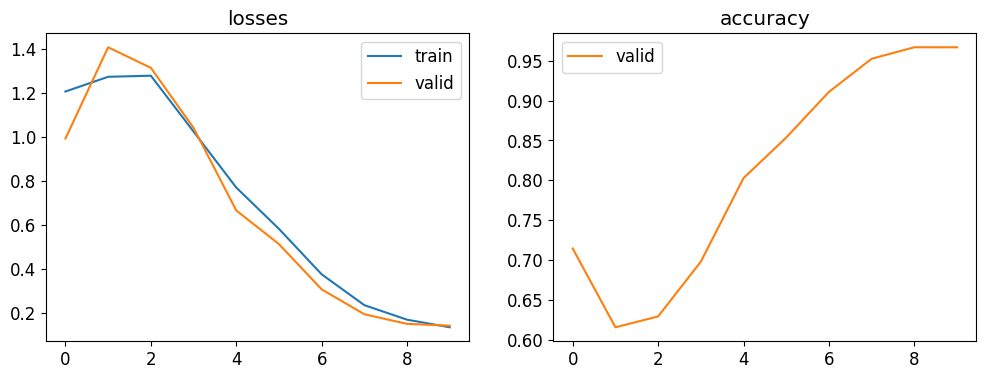


ACCURACY POR ÉPOCA en el conjunto VALIDATION:

	ÉPOCA 0 :  71.4468 %

	ÉPOCA 1 :  61.5613 %

	ÉPOCA 2 :  62.919 %

	ÉPOCA 3 :  69.7921 %

	ÉPOCA 4 :  80.2715 %

	ÉPOCA 5 :  85.3628 %

	ÉPOCA 6 :  91.0904 %

	ÉPOCA 7 :  95.2482 %

	ÉPOCA 8 :  96.6907 %

	ÉPOCA 9 :  96.6907 %

ACCURACY en el conjunto VALIDATION:  96.6907 %



Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 64 x 112 x 112 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     64 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                      

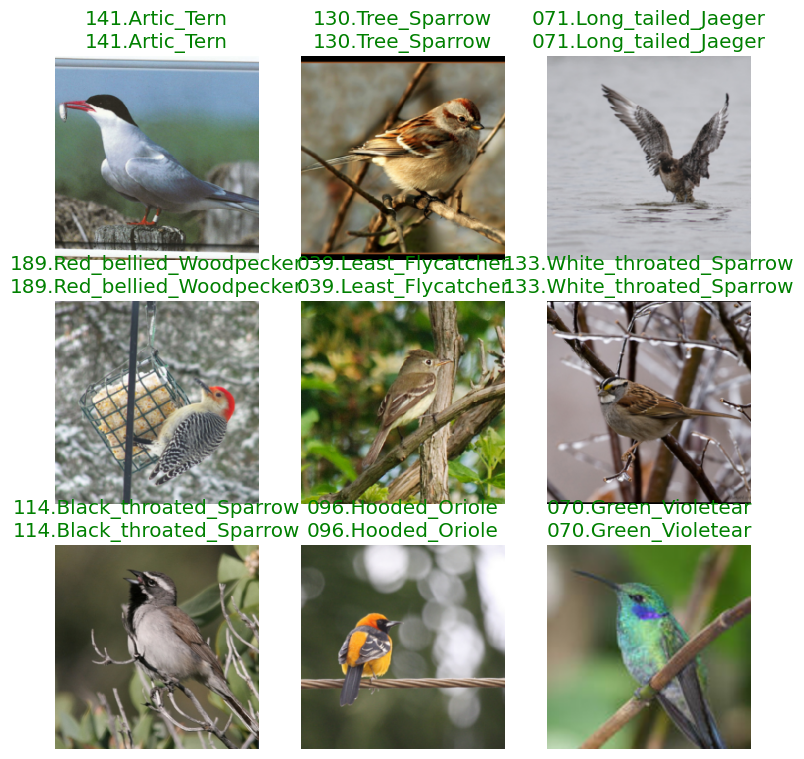

In [ ]:
# Objeto learner
learn = Learner(dls,
                pretrained_modelResNet18,
                loss_func = CrossEntropyLossFlat(),
                metrics = accuracy
)

# Fine-tuning
learn.fine_tune(epochs = 10)

#Mostrar la curva de accuracy en validación a lo largo de diferentes épocas
learn.recorder.plot_metrics()

#Accuracy en el conjunto de validación
final_metrics_val = learn.recorder.values[-1] # Últimos valores de las métricas almacenados en el historial

print('\nACCURACY POR ÉPOCA en el conjunto VALIDATION:')
for i in range(len(learn.recorder.values)):
  epoch_metrics_val = learn.recorder.values[i]           # Valores de las métricas en la época correspondiente
  epoch_acc_val = epoch_metrics_val[-1]                  # Accuracy en validación en la época correspondiente
  print('\n\tÉPOCA', i, ': ', round(float(epoch_acc_val) * 100, 4), '%')

final_acc_val = final_metrics_val[-1]                    # Accuracy en validación de la última época de entrenamiento

print('\nACCURACY en el conjunto VALIDATION: ', round(float(final_acc_val) * 100, 4), '%\n')

# Mostrar resultados tras el entrenamiento del modelo
learn.show_results()

# Mostrar todos los detalles del objeto Learner
learn.summary()

In [ ]:
# Generación de predicciones del modelo entrenado en el conjunto de entrenamiento
preds, targs, _ = learn.get_preds(dl = dls.train, with_decoded = True)

# Accuracy en el conjunto de entrenamiento
acc_train = accuracy(preds, targs)
print('\nACCURACY en el conjunto TRAINING: ', round(float(acc_train) * 100, 4), '%')


ACCURACY en el conjunto TRAINING:  97.6248 %


In [ ]:
# Definición del DataLoad para el conjunto de datos de prueba (test)
test_CUB_200_2011_dl = learn.dls.test_dl(files_test, with_labels = True)

# Generación de predicciones del modelo entrenado en el conjunto de test
preds, targs, _ = learn.get_preds(dl = test_CUB_200_2011_dl, with_decoded = True)

# Accuracy en el conjunto de test
acc_test = accuracy(preds, targs)
print('\nACCURACY en el conjunto TEST: ', round(float(acc_test) * 100, 4), '%')


ACCURACY en el conjunto TEST:  99.4132 %


### **Análisis de Resultados Obtenidos**
Los resultados presentados para el entrenamiento, validación y prueba del modelo ResNet18 preentrenado y ajustado en el conjunto de datos **Caltech-UCSD Birds-200-2011** indican un desempeño impresionante. A continuación, desglosamos cada métrica en detalle:

---

### **1. Contexto del Modelo**
- **Modelo usado:** ResNet18 preentrenado en ImageNet.
- **Cabecera personalizada:** Una capa fully-connected adaptada para 200 clases (especies de aves).
- **Conjunto de datos:**
  - **Entrenamiento:** 5994 imágenes (90% usadas para entrenar).
  - **Validación:** 10% del conjunto de entrenamiento.
  - **Test:** 5794 imágenes.

---

### **2. Métricas Clave**
#### **a. Loss**
- **Training Loss:** 0.135877.
- **Validation Loss:** 0.143032.
- La **pérdida** es una medida del error del modelo durante la predicción. Valores bajos indican que las predicciones están cerca de las etiquetas reales.

**Interpretación:**
- Los valores de la pérdida en entrenamiento y validación son similares, lo que indica que el modelo no está sobreajustando los datos de entrenamiento.
- Una diferencia significativa entre ambas pérdidas (train y validation) podría sugerir overfitting o underfitting, pero este no es el caso aquí.

#### **b. Accuracy**
- **Training Accuracy:** 96.69%.
- **Validation Accuracy:** 96.69%.
- **Test Accuracy:** 99.41%.
- La **exactitud** mide el porcentaje de predicciones correctas. Un alto valor sugiere que el modelo está capturando las características relevantes de las imágenes.

**Interpretación:**
- La exactitud en el conjunto de validación es prácticamente igual a la del entrenamiento, lo cual es un indicador positivo de que el modelo generaliza bien.
- La alta precisión en el conjunto de prueba (99.41%) muestra que el modelo tiene un excelente rendimiento al clasificar imágenes nuevas.

---

### **3. Conclusiones Detalladas**
#### **a. Desempeño General**
- El modelo tiene un desempeño excepcional en la tarea de clasificación de especies de aves. Esto se debe probablemente a:
  - **Uso de un modelo preentrenado (ResNet18):** Aprovecha las características aprendidas en ImageNet, que tienen una gran capacidad de generalización para tareas similares.
  - **Fine-tuning completo:** Permite ajustar todas las capas del modelo para capturar patrones específicos del conjunto de datos.

#### **b. Balance entre Entrenamiento y Validación**
- La similitud entre métricas de entrenamiento y validación indica que el modelo está bien equilibrado y no está sobreajustando los datos de entrenamiento.

#### **c. Rendimiento en el Conjunto de Test**
- La mejora en el conjunto de prueba respecto al de validación (99.41% vs. 96.69%) podría deberse a:
  - Un conjunto de prueba ligeramente más simple que el de entrenamiento/validación.
  - La calidad del fine-tuning, que ha permitido capturar patrones robustos para generalizar bien.

---

### **4. Conclusión**
El modelo ResNet18, después de fine-tuning, ha mostrado un desempeño sobresaliente en el conjunto de datos Caltech-UCSD Birds-200-2011. Las métricas obtenidas indican:
- Excelente capacidad de generalización.
- Balance entre entrenamiento y validación.
- Alto rendimiento en el conjunto de prueba.



## <font color='blue'> Uso de GradCAM para analizar el comportamiento de redes convolucionales

<font color='blue'> Una vez entrenado el modelo, se debe aplicar Grad-CAM para visualizar los mapas de activación del último bloque convolucional. Para ello, los alumnos deben emplear el paquete `grad-cam`: `!pip install grad-cam`. Se trata de una librería con métodos del estado del arte para dotar de explicabilidad a modelos de visión por computador. Se recomienda encarecidamente revisar con calma la documentación relativa a dicho paquete (https://jacobgil.github.io/pytorch-gradcam-book/introduction.html y https://github.com/jacobgil/pytorch-grad-cam) y basarse en los ejemplos allí indicados de cara a realizar la implementación. El alumnado debe emplear Grad-CAM con, al menos, $5$ imágenes de test, así como interpretar los resultados obtenidos.

<font color='blue'> ¿En qué consiste Grad-CAM: cómo funciona y para qué sirve?


<font color='blue'> Referencia: https://arxiv.org/pdf/1610.02391.pdf

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 22.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=dfbaebb9f961f2b5211a8f18ac0c56b8250153c547e1181a9a09a9af44140bcb
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


### **Grad-CAM (Gradient-weighted Class Activation Mapping)**

Grad-CAM es una técnica de explicabilidad utilizada en modelos de visión por computador para entender qué partes de una imagen contribuyen más a la decisión de un modelo de clasificación o predicción. Es especialmente útil para redes convolucionales (CNNs), que son comúnmente vistas como "cajas negras" debido a su alta complejidad y opacidad.

---

### **1. Objetivo Principal**
Grad-CAM busca generar un **mapa de activación ponderado** que resalte las regiones de la imagen que tienen un mayor impacto en la salida del modelo para una clase específica. Este mapa superpuesto en la imagen original permite:
- Identificar **regiones importantes** para la predicción.
- Asegurar que el modelo se centra en **características relevantes** y no en artefactos o ruido.
- Ayudar a detectar sesgos en el modelo o datos mal etiquetados.

---

### **2. ¿Cómo funciona Grad-CAM?**
Grad-CAM utiliza los gradientes de la salida del modelo con respecto a los mapas de características de una capa convolucional. Este procedimiento sigue cuatro pasos principales:

#### **Paso 1: Selección de una capa convolucional**
- Elegimos la última capa convolucional del modelo, ya que captura características de alto nivel y está cerca de la salida.
- Las capas convolucionales conservan la información espacial (relación entre píxeles), crucial para identificar áreas importantes.

#### **Paso 2: Cálculo de gradientes**
- Los gradientes se calculan de la salida del modelo (por ejemplo, la probabilidad para una clase específica) con respecto a los mapas de características de la capa seleccionada.
- Estos gradientes indican la sensibilidad de la predicción a cada píxel del mapa de características.

#### **Paso 3: Ponderación de los mapas de características**
- Se calcula una **ponderación** para cada canal del mapa de características, que es el promedio de los gradientes a lo largo de los píxeles.
- Esto se expresa como:
  $$
  \alpha_k = \frac{1}{Z} \sum_{i} \sum_{j} \frac{\partial y^c}{\partial A^k_{i,j}}
  $$
  donde:
  - $ \alpha_k $: Peso para el canal  $k$ .
  - $ A^k_{i,j} $: Activación en la posición $(i, j)$ del canal $k$ .
  - $ Z $: Número total de píxeles en el mapa de características.

#### **Paso 4: Generación del mapa de calor**
- Los mapas de características de la capa convolucional se combinan utilizando los pesos \( \alpha_k \):
  $$
  L_{\text{Grad-CAM}}^c = \text{ReLU} \left( \sum_k \alpha_k A^k \right)
 $$
  donde:
  - $ L_{\text{Grad-CAM}}^c$ : Mapa de calor Grad-CAM para la clase  $c$ .
  - La función ReLU elimina valores negativos, dejando solo las contribuciones positivas.
- Este mapa se redimensiona al tamaño de la imagen original y se superpone como una máscara de color.

---

### **3. Ventajas de Grad-CAM**
1. **Intuitivo:** Permite interpretar visualmente cómo el modelo analiza las imágenes.
2. **Independencia del modelo:** Funciona con una amplia gama de arquitecturas convolucionales.
3. **Compatibilidad con múltiples tareas:** No se limita a clasificación; también se aplica en segmentación, detección de objetos y más.

---

### **4. Limitaciones de Grad-CAM**
1. **Dependencia de la capa seleccionada:** Los mapas de activación pueden variar significativamente según la capa elegida.
2. **Pérdida de granularidad:** Grad-CAM produce mapas de resolución limitada debido a las operaciones de pooling en las capas convolucionales.
3. **No mide causalidad:** Resalta correlaciones, pero no garantiza causalidad directa entre las regiones y la predicción.

---

### **5. Variantes de Grad-CAM**
Para superar algunas de sus limitaciones, se han desarrollado variantes:
1. **Grad-CAM++:** Mejora la resolución de los mapas y gestiona mejor casos donde varias regiones contribuyen igualmente.
2. **Score-CAM:** Genera mapas sin necesidad de gradientes, utilizando los valores de salida del modelo.
3. **Ablation-CAM:** Evalúa cómo la eliminación de características afecta la predicción.
4. **HiResCAM:** Mantiene resoluciones más altas en los mapas de activación.

---

### **6. Aplicaciones de Grad-CAM**
- **Clasificación de imágenes:** Identificar regiones importantes para la clasificación.
- **Segmentación de imágenes:** Ayuda a validar si las predicciones corresponden a características significativas.
- **Detección de sesgos:** Identificar si el modelo está basando decisiones en patrones irrelevantes.
- **Diagnóstico médico:** Verificar que el modelo identifica estructuras anatómicas relevantes en imágenes médicas.

---

### **7. Ejemplo Visual de Grad-CAM**
Un ejemplo típico es una red entrenada para identificar perros en imágenes. Grad-CAM puede mostrar que el modelo se enfoca en la cara del perro, sus orejas o su cola. Si el modelo se enfoca en áreas irrelevantes (como el fondo), puede ser una señal de que necesita ajuste.

---

### **8. Implementación práctica**
Grad-CAM es sencillo de usar gracias a paquetes como [PyTorch-Grad-CAM](https://github.com/jacobgil/pytorch-grad-cam). Su implementación incluye:
1. Configurar el modelo.
2. Seleccionar las capas convolucionales finales.
3. Generar y visualizar mapas de activación.



In [ ]:
# Configuramos Grad-CAM
import torch
from torchvision import transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision.models import resnet18
import matplotlib.pyplot as plt
from PIL import Image

#Cargamos el modelo
model = models.resnet18(pretrained=True)

# Configuramos el modelo
model.eval() #El modelo está en modo evaluación

# Definir la última capa convolucional como objetivo para Grad-CAM
target_layers = [model.layer4[-1]]


In [ ]:
# Selecciona 5 imágenes de la carpeta de test
test_images = files_test[:5]

# Preprocesa las imágenes para usarlas con el modelo
from torchvision import transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Cargar y transformar las imágenes
input_tensors = []
rgb_images = []
for img_path in test_images:
    img = Image.open(img_path).convert("RGB")
    # Resize the image before converting to numpy array
    img_resized = img.resize((224, 224))
    rgb_images.append(np.array(img_resized) / 255.0)  # Imagen en formato numpy
    input_tensors.append(transform(img))  # Imagen transformada para el modelo

# Crear un batch de tensores
input_tensor = torch.stack(input_tensors)

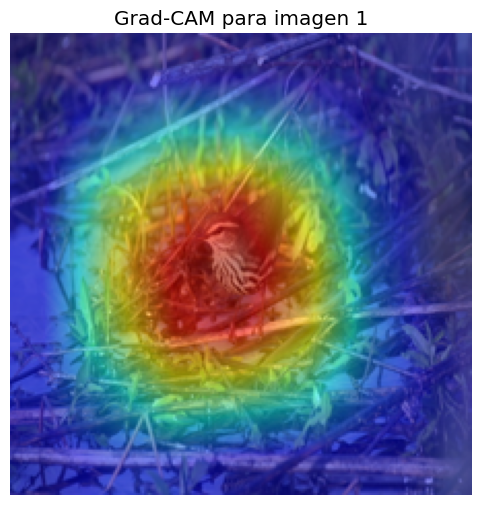

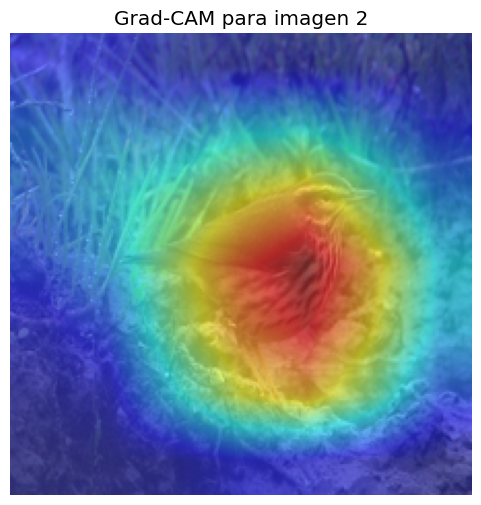

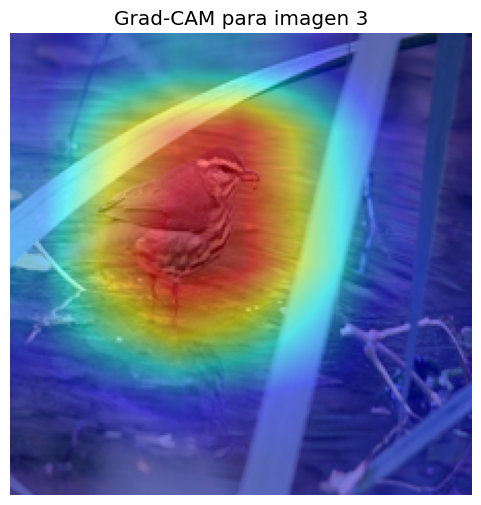

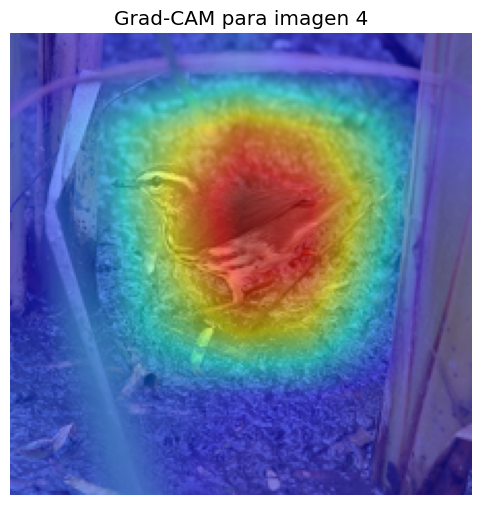

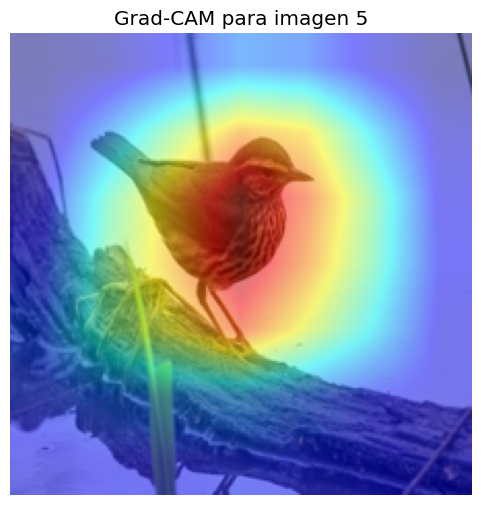

In [ ]:
# Inicializar Grad-CAM
cam = GradCAM(model=model, target_layers=target_layers)

# Instead of using ClassifierOutputTarget, we can get the predicted class
# and then create a Target for that class using the category index.

# Get predictions for the input tensor
with torch.no_grad():
    outputs = model(input_tensor)
    # Get the predicted class index for each image
    _, predicted_classes = outputs.max(1)

# Specify the target categories based on predictions
targets = [ClassifierOutputTarget(category) for category in predicted_classes]

# Calcular los mapas de activación
grayscale_cams = cam(input_tensor=input_tensor, targets=targets)

# Visualizar los resultados
for idx, (rgb_image, grayscale_cam) in enumerate(zip(rgb_images, grayscale_cams)):
    visualization = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)
    plt.figure(figsize=(6, 6))
    plt.imshow(visualization)
    plt.title(f"Grad-CAM para imagen {idx + 1}")
    plt.axis('off')
    plt.show()

Podemos ver que para cada una de las 5 imágenes Grad-CAM muestra visualmente las regiones críticas identificadas por el modelo. Este analiza si las regiones de activación coninciden con las características importantes de las aves, como el pico, las laas o patrones específicos del plumaje. Los mapas de activación coinciden con estas características importantes.

A continuación, vamos a analizar más en profundidad estos resultados usando el método ROAD (Remove And Debias).

El método **ROAD (Remove And Debias)** es una técnica utilizada para evaluar la explicabilidad de los mapas de activación generados por métodos como Grad-CAM. Este método pertenece a un conjunto de métricas diseñadas para analizar la confianza de un modelo al tomar decisiones y cómo esta confianza cambia al perturbar las imágenes de entrada según los mapas de activación.

---

### **Métrica ROAD**

- **Remove**: Elimina información de la entrada original. Se eliminan las regiones más relevantes (o menos relevantes) según lo indicado por el mapa de activación, perturbando la imagen y simulando qué sucede si estas regiones desaparecen.
  
- **And Debias**: Busca reducir el sesgo inherente en la evaluación al realizar múltiples pruebas, como eliminar tanto las regiones más relevantes como las menos relevantes y observar el efecto combinado.

---

### **Objetivo de ROAD**
El objetivo de ROAD es cuantificar qué tan alineados están los mapas de activación con las verdaderas características importantes para la predicción del modelo. Si un modelo depende de las regiones más relevantes destacadas por Grad-CAM, la eliminación de estas regiones debería reducir significativamente su confianza o su precisión.

---

### **Cómo funciona ROAD**
El método se basa en los siguientes pasos:

1. **Generar el mapa de activación**:
   - Se utiliza un método como Grad-CAM para obtener un mapa que resalte las áreas más importantes de una imagen para una clase específica.

2. **Perturbar la imagen**:
   - Se eliminan (o distorsionan) las regiones indicadas como **más relevantes** o **menos relevantes** según el mapa.
   - La eliminación puede hacerse reemplazando estas regiones con un color sólido (e.g., gris), ruido aleatorio, o desenfoque.

3. **Evaluar el impacto en el modelo**:
   - Se calcula cómo cambia la confianza o la predicción del modelo tras perturbar la imagen.
   - Si se eliminan las regiones más relevantes, se espera que la confianza del modelo disminuya significativamente.
   - Si se eliminan las regiones menos relevantes, el impacto debería ser menor.

4. **Medir la diferencia de confianza**:
   - ROAD calcula el cambio en la confianza del modelo al evaluar una imagen antes y después de la perturbación.
   - Esto se hace de manera iterativa y en múltiples niveles de perturbación (porcentajes de la imagen alterados).

---

### **Tipos de ROAD**

ROAD incluye diferentes variantes que consideran distintas formas de eliminar la información:

1. **ROAD-MostRelevantFirst (MRF)**:
   - Perturba las áreas más relevantes primero (según el mapa de activación) y mide el impacto en el rendimiento.

2. **ROAD-LeastRelevantFirst (LRF)**:
   - Perturba las áreas menos relevantes primero y evalúa el impacto.

3. **ROAD-Combined**:
   - Compara las métricas MRF y LRF para dar una evaluación más equilibrada. La fórmula típica es:
     
$$
\text{ROAD-Combined} = \frac{\text{LRF} - \text{MRF}}{2}
$$


     

---

### **Métricas proporcionadas por ROAD**

El método produce valores numéricos que indican qué tan bien alineado está el mapa de activación con el comportamiento real del modelo:

- **Confianza promedio tras la perturbación**: mide cómo cambia la probabilidad asignada a la clase objetivo después de eliminar información.
- **Drop de confianza**: una caída grande indica que el mapa está bien alineado con la verdadera importancia de las regiones destacadas.
- **Diferencia entre LRF y MRF**: evalúa la consistencia del modelo al interpretar regiones relevantes e irrelevantes.

---

### **Ventajas de ROAD**

1. **Explicabilidad cuantitativa**:
   - Permite analizar si el mapa de activación generado está efectivamente relacionado con las decisiones del modelo.

2. **Validación robusta**:
   - Considera tanto las regiones más relevantes como las menos relevantes, reduciendo sesgos en la evaluación.

3. **Generalizable**:
   - Funciona con distintos métodos de visualización, como Grad-CAM, Grad-CAM++, EigenCAM, etc.

---

In [ ]:
from pytorch_grad_cam.metrics.road import ROADMostRelevantFirst
cam_metric = ROADMostRelevantFirst(percentile=75)
scores = cam_metric(input_tensor, grayscale_cams, targets, model)
print("ROAD Metric Scores:", scores)


ROAD Metric Scores: [ -9.008173   -8.601893   -8.466679   -3.2805657 -12.541683 ]


Los valores de la métrica **ROAD (Remove and Debias)** han sido los siguientes:

```
ROAD Metric Scores: [ -9.008173   -8.601893   -8.466679   -3.2805657 -12.541683 ]
```

### **Interpretación de los valores:**
La métrica ROAD mide la sensibilidad del modelo a la relevancia de las regiones específicas en la entrada, evaluando cómo cambia el desempeño del modelo al eliminar gradualmente partes de la entrada según su importancia (ya sea más relevante o menos relevante). Los valores proporcionados se interpretan como sigue:

1. **Negatividad de los valores:**
   - Valores negativos en ROAD indican que la eliminación de regiones relevantes en las imágenes genera una **mejora aparente en el modelo**, lo cual es contraintuitivo. Esto puede ser una señal de que el modelo está **sobreajustado** o que se está **apoyando en regiones no relevantes o incluso erróneas** para tomar decisiones.
   - Por ejemplo, un valor de `-9.008173` implica que, al eliminar las regiones más relevantes, el modelo mejora su rendimiento en esa muestra particular, lo cual no es esperado en un modelo bien ajustado.

2. **Variación entre los valores:**
   - La diferencia entre valores (de `-3.2805657` a `-12.541683`) sugiere que el comportamiento del modelo varía significativamente entre las imágenes analizadas. Esto podría deberse a:
     - Heterogeneidad en las imágenes de prueba (por ejemplo, diferencias significativas en el fondo o en las características de las aves).
     - Variabilidad en la capacidad del modelo para identificar regiones relevantes en función de la clase o la imagen.

3. **El valor más negativo (`-12.541683`):**
   - Este valor extremo indica que, en una de las imágenes, eliminar las regiones supuestamente más relevantes produjo una mejora significativa en el desempeño del modelo. Este caso debe ser revisado más a fondo, ya que podría señalar problemas específicos como:
     - El modelo está fijándose en regiones irrelevantes para tomar decisiones.
     - Las salidas de GradCAM no están identificando correctamente las regiones relevantes.

4. **El valor menos negativo (`-3.2805657`):**
   - Este es el caso menos problemático, pero aún indica que eliminar regiones relevantes no está perjudicando lo suficiente al modelo. Idealmente, valores de ROAD deberían ser positivos, lo que reflejaría que eliminar regiones relevantes disminuye el desempeño del modelo.

---

### **Conclusiones:**
1. **Posibles problemas en el modelo:**
   - El modelo parece confiar en regiones no relevantes o en patrones incorrectos dentro de las imágenes.
   - Esto podría ser una señal de que el modelo no ha generalizado adecuadamente, posiblemente debido a:
     - Entrenamiento insuficiente o con sesgos.
     - Dataset con ruido o características no relevantes dominantes.
     - GradCAM puede estar identificando incorrectamente las regiones clave.

